## This Model presents a fire detection and alarm system implemented using TensorFlow, a popular deep learning framework. The system utilizes convolutional neural networks (CNNs) to analyze real-time images or video feeds from fire-prone areas. The CNN model is trained on a large dataset of fire and non-fire images to accurately identify fire occurrences. Once a fire is detected, the system triggers an alarm and sends notifications to relevant authorities for prompt action. The use of TensorFlow allows for efficient and reliable fire detection, enhancing safety measures and minimizing potential damages caused by fires.

### Importing our necessary libraries

In [1]:
import tensorflow as tf
import keras_preprocessing
from keras_preprocessing import image
from keras_preprocessing.image import ImageDataGenerator
import shutil   #library, which provides high-level file operations like copying, moving, and deleting files and directories.


     

2023-04-05 07:08:44.567249: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-04-05 07:08:44.613121: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-04-05 07:08:44.613696: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-05 07:08:45.473073: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [5]:
TRAINING_DIR = "../Desktop/data1/Training"  #Specifying the path to Training Dataset
VALIDATION_DIR = "../Desktop/data1/Validation"  #Specifing the path to our validation dataset

training_datagen = ImageDataGenerator(rescale = 1./255,horizontal_flip=True,rotation_range=30,height_shift_range=0.2,fill_mode='nearest')
# This generator is used to create augmented image data for training deep learning models.

validation_datagen = ImageDataGenerator(rescale = 1./255)
# This generator is used to create augmented image data for validating deep learning models.


train_generator = training_datagen.flow_from_directory(TRAINING_DIR, target_size=(224,224), class_mode='categorical', batch_size = 64)
#reading the train images from our folder and setting parameters
validation_generator = validation_datagen.flow_from_directory(VALIDATION_DIR, target_size=(224,224), class_mode='categorical', batch_size= 16)
#reading the validation images

Found 980 images belonging to 2 classes.
Found 239 images belonging to 2 classes.


# insights


__This code block is preparing the image data generators to read the training and validation image datasets for a deep learning model.__

__TRAINING_DIR and VALIDATION_DIR are variables that store the paths to the directories where the training and validation image datasets are stored, respectively.__

__training_datagen and validation_datagen are ImageDataGenerator objects that are used to create augmented image data for training and validating the deep learning model, respectively. The rescale parameter is used to normalize the pixel values of the images to the range [0, 1]. The other parameters (horizontal_flip, rotation_range, height_shift_range, and fill_mode) are used to perform various image augmentation operations.__

__train_generator and validation_generator are DirectoryIterator objects that use the flow_from_directory method to read the images from the training and validation directories, respectively. The target_size parameter specifies the size of the images after resizing. The class_mode parameter specifies the type of classification task (in this case, categorical classification). The batch_size parameter specifies the number of images in each batch of data that the model will see during training.__







# Defining our model and setting the layers

In [6]:
from tensorflow.keras.optimizers import RMSprop,Adam
model = tf.keras.models.Sequential([
          tf.keras.layers.Conv2D(96, (11,11), strides=(4,4), activation='relu', input_shape=(224, 224, 3)),
          tf.keras.layers.MaxPooling2D(pool_size = (3,3), strides=(2,2)),
          tf.keras.layers.Conv2D(256, (5,5), activation='relu'),
          tf.keras.layers.MaxPooling2D(pool_size = (3,3), strides=(2,2)),
          tf.keras.layers.Conv2D(384, (5,5), activation='relu'),
          tf.keras.layers.MaxPooling2D(pool_size = (3,3), strides=(2,2)),
          tf.keras.layers.Flatten(),
          tf.keras.layers.Dropout(0.2),
          tf.keras.layers.Dense(2048, activation='relu'),
          tf.keras.layers.Dropout(0.25),
          tf.keras.layers.Dense(1024, activation='relu'),
          tf.keras.layers.Dropout(0.2),
          tf.keras.layers.Dense(2, activation='softmax')
])
model.compile(loss='categorical_crossentropy', optimizer=Adam(lr=0.0001), metrics=['acc'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 54, 54, 96)        34944     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 26, 26, 96)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 22, 22, 256)       614656    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 10, 10, 256)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 6, 6, 384)         2457984   
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 2, 2, 384)        0

# Insights


__This code block defines a sequential deep learning model for image classification using the tf.keras API in TensorFlow. The model has several layers, including convolutional layers, max pooling layers, flatten layer, and dense layers.__

__The model architecture is as follows:__

* The first layer is a Conv2D layer with 96 filters of size (11,11) and a stride of (4,4). The activation function is relu, and the input shape is (224,224,3), which corresponds to 224x224 color images.
* The second layer is a MaxPooling2D layer with a pool size of (3,3) and a stride of (2,2).
* The third layer is a Conv2D layer with 256 filters of size (5,5) and an activation function of relu.
* The fourth layer is a MaxPooling2D layer with a pool size of (3,3) and a stride of (2,2).
* The fifth layer is a Conv2D layer with 384 filters of size (5,5) and an activation function of relu.
* The sixth layer is a MaxPooling2D layer with a pool size of (3,3) and a stride of (2,2).
* The seventh layer is a Flatten layer that converts the output of the convolutional layers into a 1D array.
* The eighth layer is a Dropout layer with a rate of 0.2, which is used for regularization to prevent overfitting.
* The ninth layer is a Dense layer with 2048 units and an activation function of relu.
* The tenth layer is a Dropout layer with a rate of 0.25.
* The eleventh layer is a Dense layer with 1024 units and an activation function of relu.
* The twelfth and final layer is a Dense layer with 2 units and an activation function of softmax, which is used for binary classification.

**The compile method is used to configure the model for training. The loss parameter specifies the loss function to use, which in this case is categorical_crossentropy since the classification task is categorical. The optimizer parameter specifies the optimization algorithm to use during training, which is Adam with a learning rate of 0.0001. The metrics parameter specifies the evaluation metric to use, which in this case is accuracy.**

**The summary method is used to display a summary of the model architecture, including the layers, output shape, and number of parameters.**

## Model Training


__This code below uses the fit method of the Keras model to train the model on the generated data from the train_generator and validation_generator for a specified number of epochs.__

In [7]:
history = model.fit(train_generator, steps_per_epoch = 15, epochs = 50, validation_data = validation_generator,     validation_steps = 15
    #callbacks=[callbacks]
)

#train_generator: The generator object that generates batches of augmented training images.
#steps_per_epoch: Number of batches of training data to process before going to the next epoch.
#epochs: Number of times to iterate over the entire training dataset.
#validation_data: The generator object that generates batches of augmented validation images.
#validation_steps: Number of batches of validation data to process before going to the next epoch.
#The fit method trains the model by updating the weights of the model based on the loss function and the optimizer specified during model compilation. The training progress and performance metrics are stored in the history object.

2023-04-05 07:55:56.752494: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 38535168 exceeds 10% of free system memory.
2023-04-05 07:55:56.967868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


Epoch 1/50


2023-04-05 07:56:00.352200: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 38535168 exceeds 10% of free system memory.
2023-04-05 07:56:00.414715: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 71663616 exceeds 10% of free system memory.
2023-04-05 07:56:01.129922: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 31719424 exceeds 10% of free system memory.
2023-04-05 07:56:02.592100: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 31719424 exceeds 10% of free system memory.


15/15 [==============================] - ETA: 0s - loss: 0.7634 - acc: 0.6496

2023-04-05 07:56:45.642337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


15/15 [==============================] - 55s 3s/step - loss: 0.7634 - acc: 0.6496 - val_loss: 0.4605 - val_acc: 0.7824
Epoch 2/50
15/15 [==============================] - 53s 3s/step - loss: 0.4269 - acc: 0.7686 - val_loss: 0.3864 - val_acc: 0.7364
Epoch 3/50
15/15 [==============================] - 49s 3s/step - loss: 0.3191 - acc: 0.8843 - val_loss: 0.4142 - val_acc: 0.8326
Epoch 4/50
15/15 [==============================] - 48s 3s/step - loss: 0.2955 - acc: 0.8854 - val_loss: 0.3443 - val_acc: 0.8703
Epoch 5/50
15/15 [==============================] - 46s 3s/step - loss: 0.3468 - acc: 0.8832 - val_loss: 0.4112 - val_acc: 0.8661
Epoch 6/50
15/15 [==============================] - 48s 3s/step - loss: 0.4015 - acc: 0.8766 - val_loss: 0.4161 - val_acc: 0.8661
Epoch 7/50
15/15 [==============================] - 47s 3s/step - loss: 0.2940 - acc: 0.8854 - val_loss: 0.3062 - val_acc: 0.8996
Epoch 8/50
15/15 [==============================] - 47s 3s/step - loss: 0.2706 - acc: 0.8788 - val_lo

# Visualization of Training and Validation Accuracy and Loss

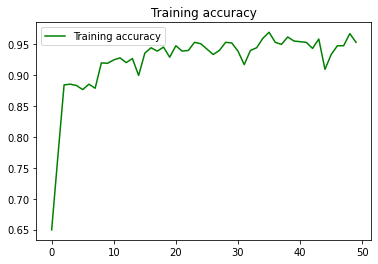

<Figure size 432x288 with 0 Axes>

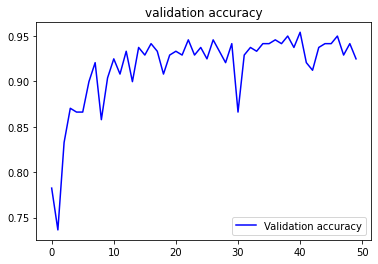

<Figure size 432x288 with 0 Axes>

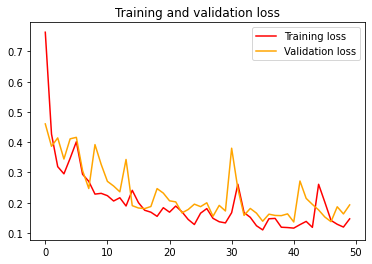

<Figure size 432x288 with 0 Axes>

In [8]:

%matplotlib inline
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

# The training set is used to train the model
plt.plot(epochs, acc, 'g', label='Training accuracy')
plt.title('Training accuracy')
plt.legend(loc=0)
plt.figure()
plt.show()

# validation set is only used to evaluate the model's performance
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('validation accuracy')
plt.legend(loc=0)
plt.figure()
plt.show()

# the loss during training and validation process
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'orange', label='Validation loss')
plt.title('Training and validation loss')

plt.legend(loc=0)
plt.figure()
plt.show()
     

## Predicting Random Images to detect Fire or No Fire

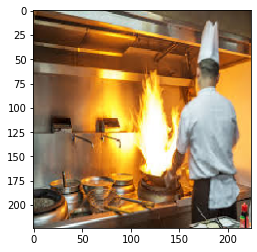

1/1 [==============================] - 0s 32ms/step
image_4.jpg fire 0.9996704


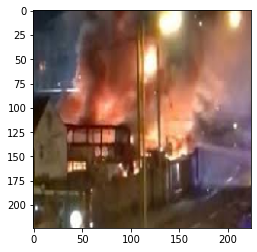

1/1 [==============================] - 0s 33ms/step
image_3.jpg fire 0.9994623


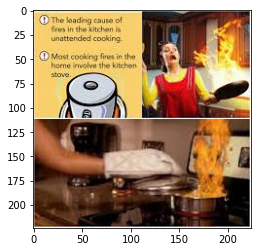

1/1 [==============================] - 0s 29ms/step
image_1.jpg fire 0.7917913


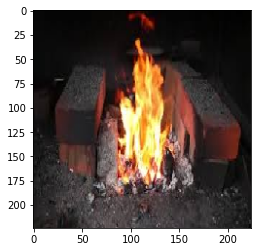

1/1 [==============================] - 0s 29ms/step
image_2.jpg fire 0.9996811


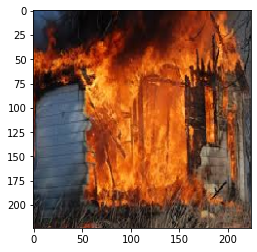

1/1 [==============================] - 0s 30ms/step
image_10.jpg fire 0.99999917


In [47]:
import numpy as np
import os
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

#model = # your pre-trained model

# Specify the directory containing the images
dir_path = '../Desktop/test1'

# Define the label names for "fire" and "no fire"
label_names = ['fire', 'no fire']

# Loop through each image file in the directory
for file_name in os.listdir(dir_path):
    # Load the image and resize it to 224x224 pixels
    path = os.path.join(dir_path, file_name)
    img = image.load_img(path, target_size=(224, 224))
    
      # Show the image
    plt.imshow(img)
    plt.show()
    
    
    # Convert the image to a numpy array
    x = image.img_to_array(img)
    
    # Add a new dimension to the array to represent the batch size and normalize the pixel values
    x = np.expand_dims(x, axis=0) / 255.0
    
    # Use the pre-trained model to make a prediction on the input image
    classes = model.predict(x)
    
        
    # Get the predicted class index and label name

    predicted_class_index = np.argmax(classes[0])
    predicted_label_name = label_names[predicted_class_index]
    
      
    # Print the predicted label and the maximum probability value for the predicted label
    print(file_name, predicted_label_name, max(classes[0]))


# Creating customized InceptionV3 model for model Testing



__The customized InceptionV3 model  uses Keras  have some modifications to the original architecture, such as different number of filters, different number of layers, or different activation functions, depending on your specific requirements for the task at hand.__

__InceptionV3 also includes other techniques such as batch normalization and bottleneck layers, which help to improve the efficiency and performance of the network.__

__Also be reminded that we tested our model using a different set of data__

In [49]:
TRAINING_DIR = '../Desktop/Dataset 3/Train'

training_datagen = ImageDataGenerator(rescale=1./255, zoom_range=0.15, horizontal_flip=True, fill_mode='nearest')

VALIDATION_DIR = '../Desktop/Dataset 3/Test'
validation_datagen = ImageDataGenerator(rescale = 1./255)

train_generator = training_datagen.flow_from_directory(TRAINING_DIR, target_size=(224,224), shuffle = True, class_mode='categorical',  batch_size = 128)

validation_generator = validation_datagen.flow_from_directory(VALIDATION_DIR, target_size=(224,224), class_mode='categorical', shuffle = True, batch_size= 14)
     


Found 1800 images belonging to 2 classes.
Found 200 images belonging to 2 classes.


## Importing Modules to create Customized InceptionV3 Model

In [50]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Input, Dropout
     

## Model creation
__Creating a new model by taking the pre-trained InceptionV3 model as the base and adding some new layers on top of it. This allows you to leverage the pre-trained weights of the InceptionV3 model and fine-tune it for a new task.

The new layers added on top include a global average pooling layer, a fully-connected layer with 2048 units and ReLU activation, a dropout layer to reduce overfitting, another fully-connected layer with 1024 units and ReLU activation, another dropout layer, and finally an output layer with a softmax activation function to predict the two classes.

__The for loop sets all the layers in the pre-trained InceptionV3 model to be non-trainable, meaning that their weights will not be updated during training. This is because we want to leverage the pre-trained weights to perform feature extraction for our new task, and only fine-tune the new layers we added on top.__

__The compile function compiles the model with the RMSprop optimizer, categorical cross-entropy loss function, and accuracy as the evaluation metric.__

In [51]:
input_tensor = Input(shape=(224, 224, 3))

base_model = InceptionV3(input_tensor=input_tensor, weights='imagenet', include_top=False)

# add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
# add a fully-connected layer
x = Dense(2048, activation='relu')(x)
x = Dropout(0.25)(x)
# output layer
x = Dense(1024, activation='relu')(x)
x = Dropout(0.2)(x)
predictions = Dense(2, activation='softmax')(x)
# model
model = Model(inputs=base_model.input, outputs=predictions)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['acc'])

87910968/87910968 [==============================] - 40s 0us/step


In [53]:
for layer in model.layers[:249]:      #freeze the weights of the first 249 layers of the model
   layer.trainable = False
for layer in model.layers[249:]:       #allowing the weights of the remaining layers (249 and above) to be trained during the fine-tuning process
   layer.trainable = True


#the compile method is called again to re-compile the model with a new optimizer 
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['acc'])

#The on_epoch_end method of the myCallback object is used to monitor the training process and stop training early if both the training and validation loss fall below a certain threshold.
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('val_loss')<=0.1099 and logs.get('loss')<=0.1099):
      print('\n\n Reached The Destination!')
      self.model.stop_training = True
callbacks = myCallback()

history = model.fit(train_generator, steps_per_epoch = 14, epochs = 10, validation_data = validation_generator, validation_steps = 14)
print(len(base_model.layers))
     

2023-04-05 15:56:58.959882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


Epoch 1/10
14/14 [==============================] - ETA: 0s - loss: 0.2303 - acc: 0.9025 

2023-04-05 16:00:35.565869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


14/14 [==============================] - 230s 12s/step - loss: 0.2303 - acc: 0.9025 - val_loss: 0.2670 - val_acc: 0.9439
Epoch 2/10
14/14 [==============================] - 174s 11s/step - loss: 0.0251 - acc: 0.9922 - val_loss: 0.1344 - val_acc: 0.9541
Epoch 3/10
14/14 [==============================] - 164s 12s/step - loss: 0.0371 - acc: 0.9839 - val_loss: 0.0987 - val_acc: 0.9643
Epoch 4/10
14/14 [==============================] - 152s 11s/step - loss: 0.0138 - acc: 0.9976 - val_loss: 0.0974 - val_acc: 0.9643
Epoch 5/10
14/14 [==============================] - 160s 11s/step - loss: 0.0098 - acc: 0.9964 - val_loss: 0.0683 - val_acc: 0.9796
Epoch 6/10
14/14 [==============================] - 161s 11s/step - loss: 0.0037 - acc: 0.9994 - val_loss: 0.0405 - val_acc: 0.9847
Epoch 7/10
14/14 [==============================] - 152s 11s/step - loss: 0.0027 - acc: 0.9988 - val_loss: 0.0712 - val_acc: 0.9796
Epoch 8/10
14/14 [==============================] - 153s 11s/step - loss: 0.0019 - acc:

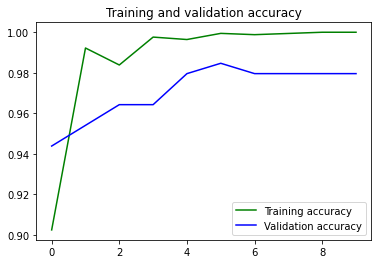

<Figure size 432x288 with 0 Axes>

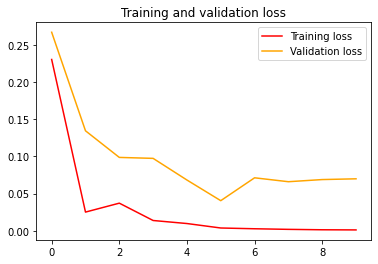

<Figure size 432x288 with 0 Axes>

In [54]:

%matplotlib inline
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'g', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')

plt.legend(loc=0)
plt.figure()
plt.show()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'orange', label='Validation loss')
plt.title('Training and validation loss')

plt.legend(loc=0)
plt.figure()
plt.show()
flag = 1

In [55]:
flag = 1

In [57]:
import numpy as np

from keras.preprocessing import image
     

##  Setting the Alarm Buzzer

In [70]:
#function used to play an audio file as an alert or notification sound 
def play_alert_sound():
    pygame.mixer.init()
    alert_sound = pygame.mixer.Sound('../Desktop/fire_alarm.mp3')
    alert_sound.play()
    time.sleep(0.1)
    alert_sound.play()

## Prediction

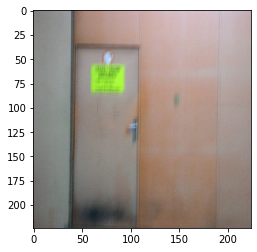

1/1 [==============================] - 5s 5s/step
image_89.jpg No fire 0.99944526


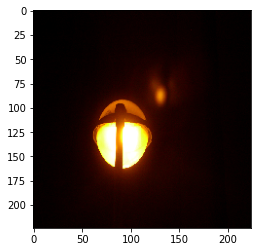

1/1 [==============================] - 0s 109ms/step
image_88.jpg Fire 0.99753237


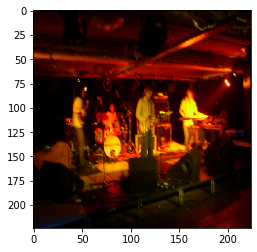

1/1 [==============================] - 0s 94ms/step
image_85.jpg Fire 0.9790151


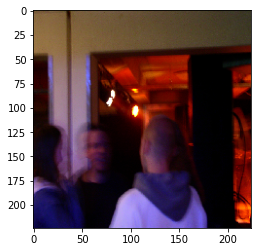

1/1 [==============================] - 0s 95ms/step
image_82.jpg No fire 0.9995995


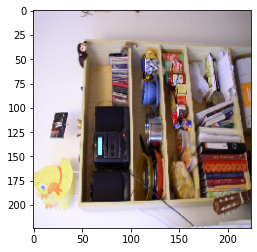

1/1 [==============================] - 0s 103ms/step
image_68.jpg No fire 0.9999379


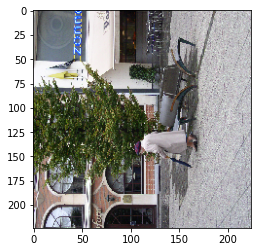

1/1 [==============================] - 0s 105ms/step
image_24.jpg No fire 0.9999931


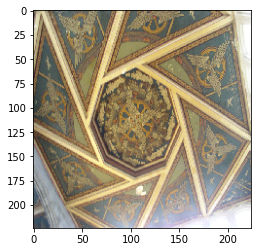

1/1 [==============================] - 0s 87ms/step
image_53.jpg No fire 0.99999475


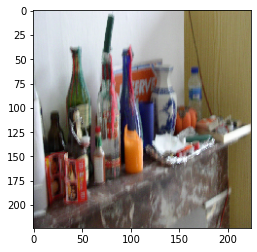

1/1 [==============================] - 0s 89ms/step
image_71.jpg No fire 0.9997632


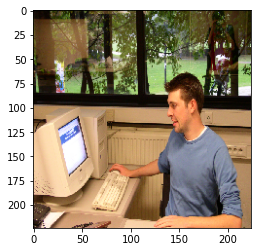

1/1 [==============================] - 0s 98ms/step
image_65.jpg No fire 1.0


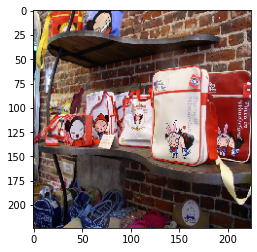

1/1 [==============================] - 0s 88ms/step
image_50.jpg No fire 0.99999964


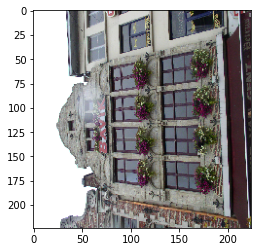

1/1 [==============================] - 0s 89ms/step
image_42.jpg No fire 0.9999796


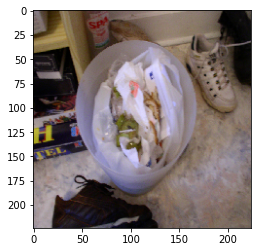

1/1 [==============================] - 0s 93ms/step
image_74.jpg No fire 0.99999416


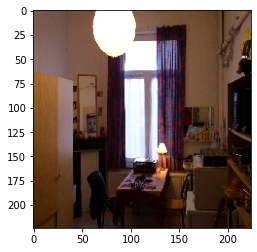

1/1 [==============================] - 0s 111ms/step
image_67.jpg No fire 1.0


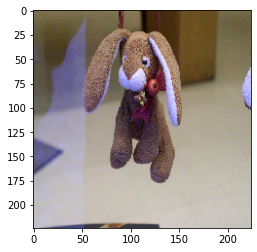

1/1 [==============================] - 0s 120ms/step
image_25.jpg No fire 0.9998995


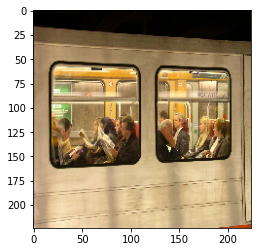

1/1 [==============================] - 0s 88ms/step
image_60.jpg No fire 0.9998827


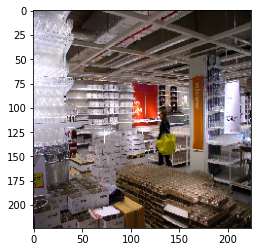

1/1 [==============================] - 0s 87ms/step
image_97.jpg No fire 0.99999976


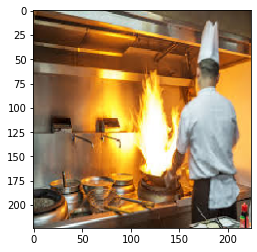

1/1 [==============================] - 0s 96ms/step
image_4.jpg Fire 1.0


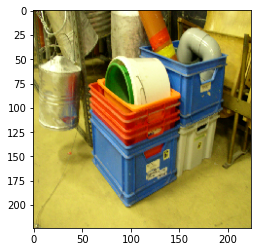

1/1 [==============================] - 0s 115ms/step
image_80.jpg No fire 0.9999976


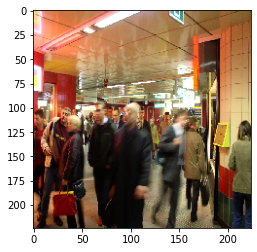

1/1 [==============================] - 0s 87ms/step
image_58.jpg No fire 1.0


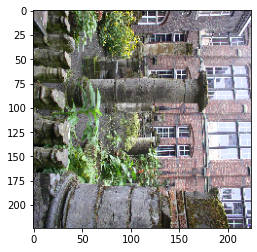

1/1 [==============================] - 0s 128ms/step
image_32.jpg No fire 0.9997899


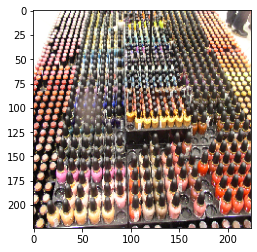

1/1 [==============================] - 0s 95ms/step
image_44.jpg No fire 0.99999774


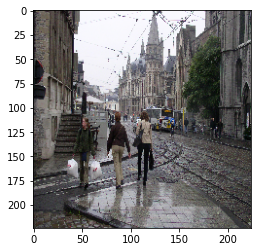

1/1 [==============================] - 0s 114ms/step
image_31.jpg No fire 1.0


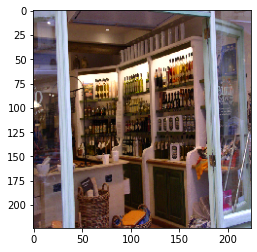

1/1 [==============================] - 0s 94ms/step
image_23.jpg No fire 1.0


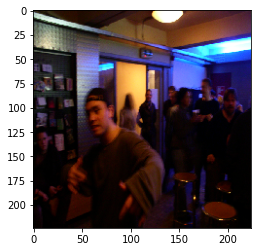

1/1 [==============================] - 0s 93ms/step
image_84.jpg No fire 1.0


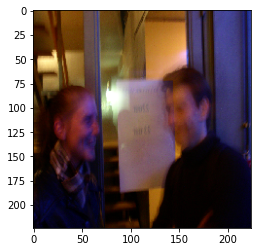

1/1 [==============================] - 0s 110ms/step
image_81.jpg No fire 0.99999976


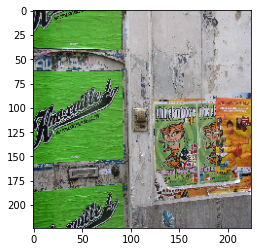

1/1 [==============================] - 0s 87ms/step
image_48.jpg No fire 0.9999944


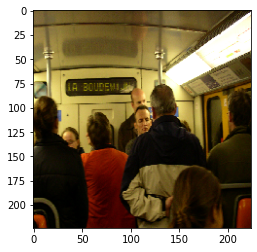

1/1 [==============================] - 0s 116ms/step
image_62.jpg No fire 1.0


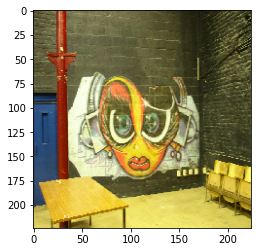

1/1 [==============================] - 0s 113ms/step
image_78.jpg No fire 0.99997365


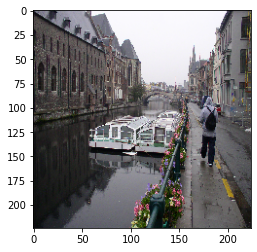

1/1 [==============================] - 0s 116ms/step
image_36.jpg No fire 1.0


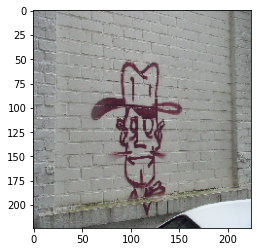

1/1 [==============================] - 0s 122ms/step
image_49.jpg No fire 0.9994197


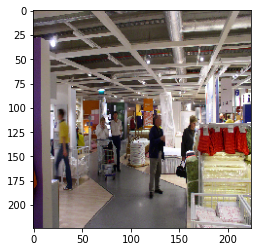

1/1 [==============================] - 0s 91ms/step
image_94.jpg No fire 1.0


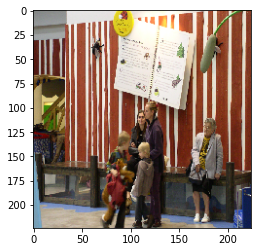

1/1 [==============================] - 0s 116ms/step
image_90.jpg No fire 1.0


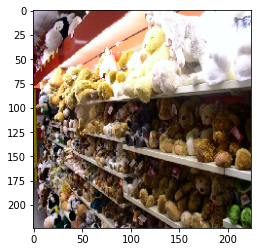

1/1 [==============================] - 0s 87ms/step
image_51.jpg No fire 0.99993205


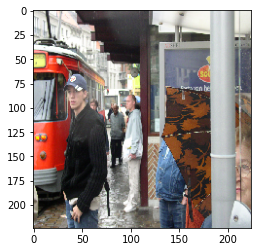

1/1 [==============================] - 0s 118ms/step
image_47.jpg No fire 0.99987257


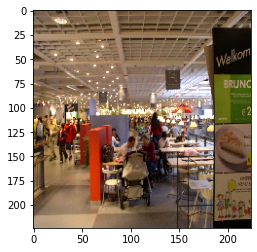

1/1 [==============================] - 0s 117ms/step
image_91.jpg No fire 1.0


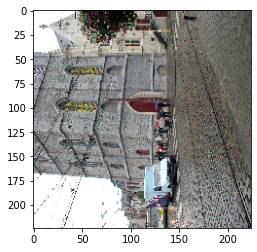

1/1 [==============================] - 0s 87ms/step
image_27.jpg No fire 0.9999993


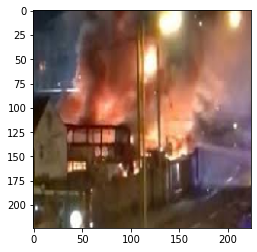

1/1 [==============================] - 0s 91ms/step
image_3.jpg Fire 1.0


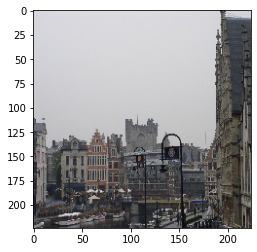

1/1 [==============================] - 0s 109ms/step
image_38.jpg No fire 0.9951238


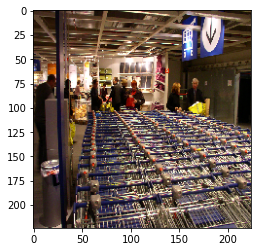

1/1 [==============================] - 0s 90ms/step
image_96.jpg No fire 1.0


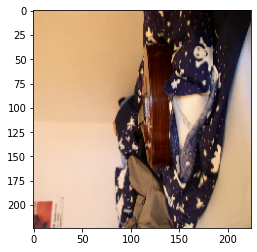

1/1 [==============================] - 0s 117ms/step
image_69.jpg No fire 0.99779725


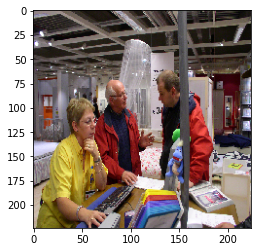

1/1 [==============================] - 0s 96ms/step
image_95.jpg No fire 1.0


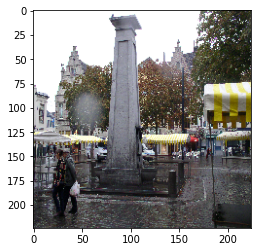

1/1 [==============================] - 0s 91ms/step
image_45.jpg No fire 0.99555415


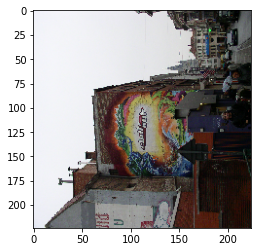

1/1 [==============================] - 0s 119ms/step
image_22.jpg No fire 0.99352384


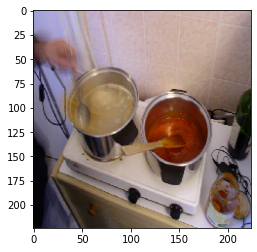

1/1 [==============================] - 0s 119ms/step
image_75.jpg No fire 0.99237895


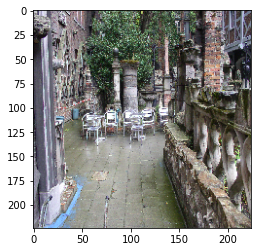

1/1 [==============================] - 0s 101ms/step
image_33.jpg No fire 1.0


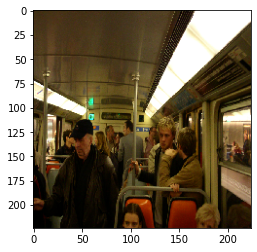

1/1 [==============================] - 0s 107ms/step
image_61.jpg No fire 1.0


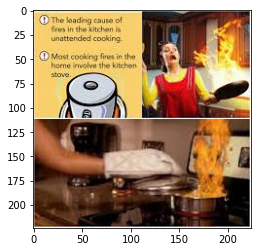

1/1 [==============================] - 0s 88ms/step
image_1.jpg Fire 0.9037295


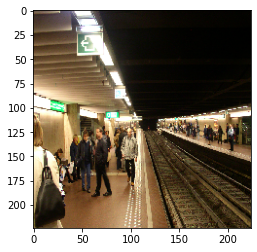

1/1 [==============================] - 0s 118ms/step
image_59.jpg No fire 1.0


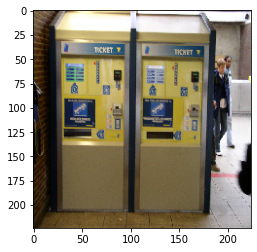

1/1 [==============================] - 0s 111ms/step
image_63.jpg No fire 0.9999993


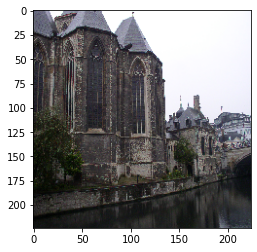

1/1 [==============================] - 0s 87ms/step
image_37.jpg No fire 0.86117595


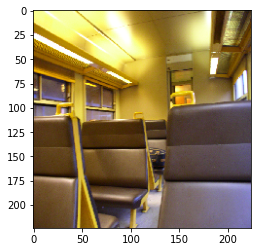

1/1 [==============================] - 0s 87ms/step
image_54.jpg No fire 1.0


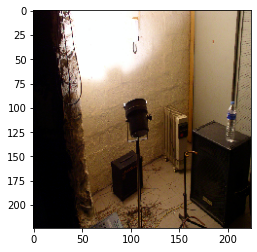

1/1 [==============================] - 0s 96ms/step
image_76.jpg No fire 0.99999464


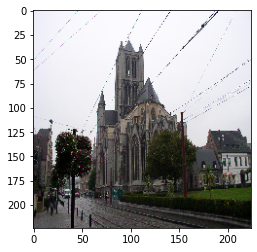

1/1 [==============================] - 0s 88ms/step
image_26.jpg No fire 0.9999443


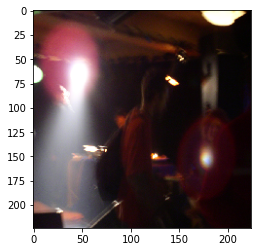

1/1 [==============================] - 0s 86ms/step
image_86.jpg Fire 0.76564145


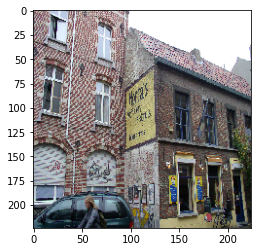

1/1 [==============================] - 0s 88ms/step
image_35.jpg No fire 0.99958855


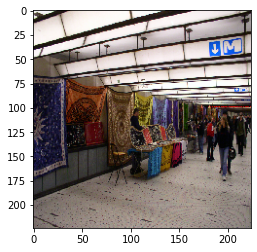

1/1 [==============================] - 0s 89ms/step
image_57.jpg No fire 1.0


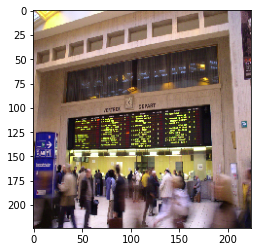

1/1 [==============================] - 0s 87ms/step
image_56.jpg No fire 1.0


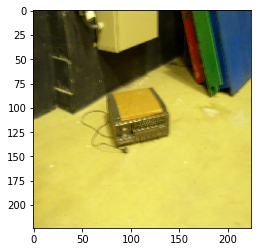

1/1 [==============================] - 0s 90ms/step
image_79.jpg No fire 0.9987796


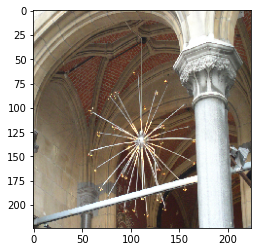

1/1 [==============================] - 0s 86ms/step
image_40.jpg No fire 0.9999999


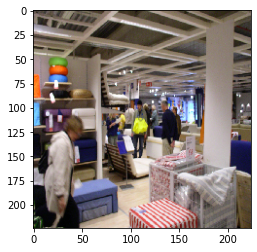

1/1 [==============================] - 0s 88ms/step
image_92.jpg No fire 1.0


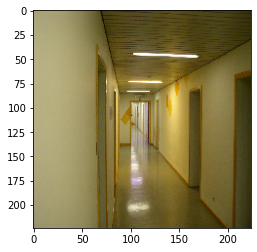

1/1 [==============================] - 0s 87ms/step
image_99.jpg No fire 1.0


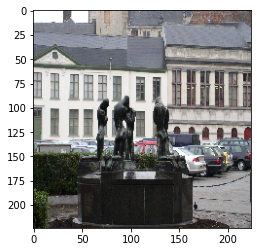

1/1 [==============================] - 0s 88ms/step
image_28.jpg No fire 0.9999212


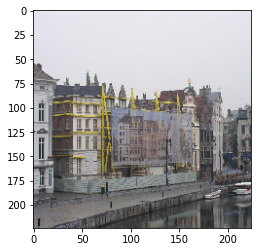

1/1 [==============================] - 0s 87ms/step
image_39.jpg No fire 0.9980525


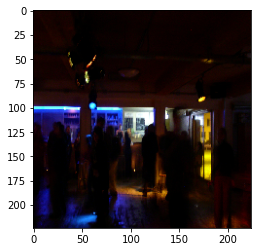

1/1 [==============================] - 0s 90ms/step
image_87.jpg No fire 0.9999993


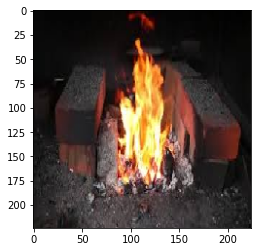

1/1 [==============================] - 0s 88ms/step
image_2.jpg Fire 1.0


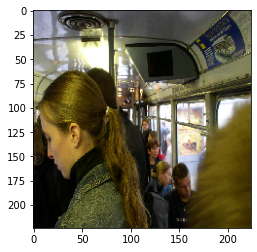

1/1 [==============================] - 0s 97ms/step
image_52.jpg No fire 1.0


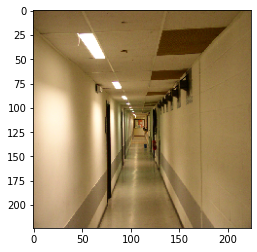

1/1 [==============================] - 0s 88ms/step
image_64.jpg No fire 1.0


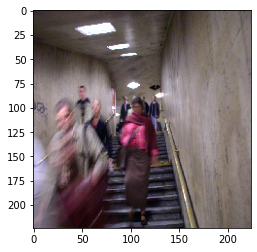

1/1 [==============================] - 0s 89ms/step
image_55.jpg No fire 1.0


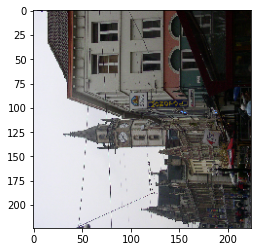

1/1 [==============================] - 0s 86ms/step
image_46.jpg No fire 0.9986965


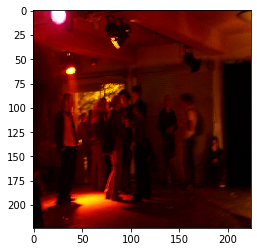

1/1 [==============================] - 0s 87ms/step
image_83.jpg No fire 0.99979466


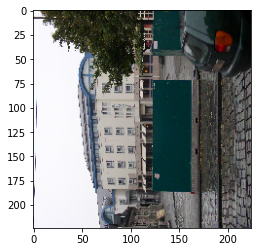

1/1 [==============================] - 0s 88ms/step
image_29.jpg No fire 0.99960774


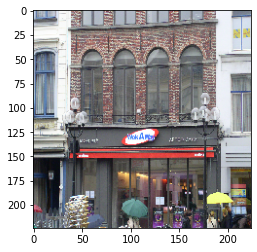

1/1 [==============================] - 0s 88ms/step
image_41.jpg No fire 0.99991524


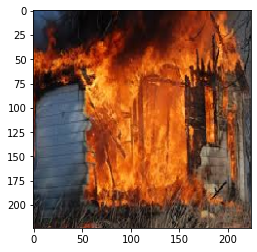

1/1 [==============================] - 0s 85ms/step
image_10.jpg Fire 1.0


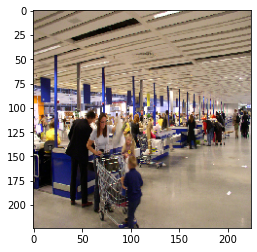

1/1 [==============================] - 0s 87ms/step
image_98.jpg No fire 1.0


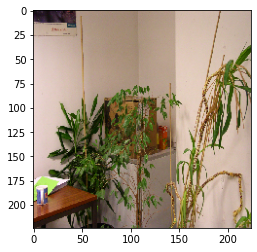

1/1 [==============================] - 0s 87ms/step
image_66.jpg No fire 0.99931216


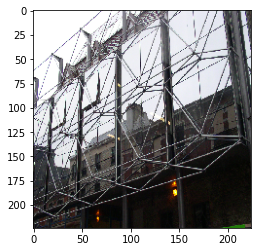

1/1 [==============================] - 0s 88ms/step
image_30.jpg No fire 0.9994972


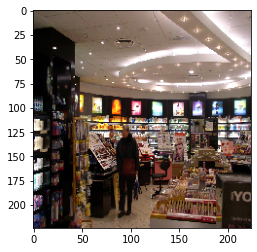

1/1 [==============================] - 0s 91ms/step
image_43.jpg No fire 1.0


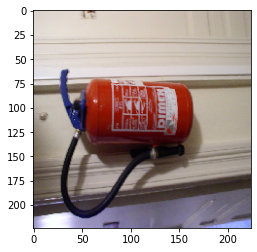

1/1 [==============================] - 0s 88ms/step
image_73.jpg No fire 0.9998441


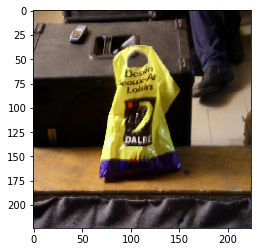

1/1 [==============================] - 0s 115ms/step
image_77.jpg No fire 0.9995912


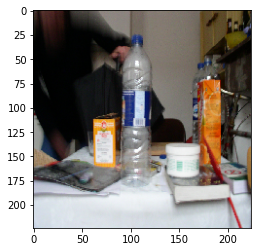

1/1 [==============================] - 0s 136ms/step
image_72.jpg No fire 0.999843


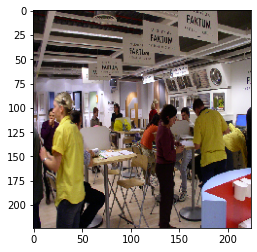

1/1 [==============================] - 0s 93ms/step
image_93.jpg No fire 1.0


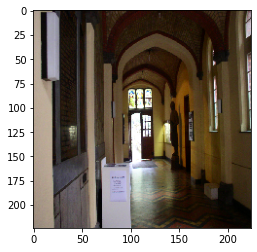

1/1 [==============================] - 0s 102ms/step
image_34.jpg No fire 0.9999982


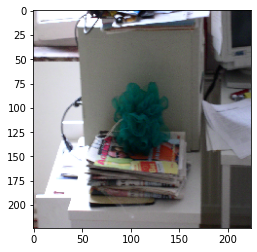

1/1 [==============================] - 0s 91ms/step
image_70.jpg No fire 0.99999607


In [82]:
import time
import numpy as np
import os
import pygame
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

#model = # your pre-trained model

# Specify the directory containing the images
dir_path = '../Desktop/test1'

# Define the label names for "fire" and "no fire"
label_names = ['Fire', 'No fire']

# Loop through each image file in the directory
for file_name in os.listdir(dir_path):
    # Load the image and resize it to 224x224 pixels
    path = os.path.join(dir_path, file_name)
    img = image.load_img(path, target_size=(224, 224))
    
      # Show the image
    plt.imshow(img)
    plt.show()
    
    
    # Convert the image to a numpy array
    x = image.img_to_array(img)
    
    # Add a new dimension to the array to represent the batch size and normalize the pixel values
    x = np.expand_dims(x, axis=0) / 255.0
    
    # Use the pre-trained model to make a prediction on the input image
    classes = model.predict(x)
    
        
    # Get the predicted class index and label name

    predicted_class_index = np.argmax(classes[0])
    predicted_label_name = label_names[predicted_class_index]
    
      
    # Print the predicted label and the maximum probability value for the predicted label
    print(file_name, predicted_label_name, max(classes[0]))
    play_alert_sound()

# Email configuration

In [83]:
import smtplib
from email.mime.image import MIMEImage
from email.mime.text import MIMEText
from email.mime.multipart import MIMEMultipart
import datetime
     

In [84]:
import ssl
print(ssl.OPENSSL_VERSION)
     

OpenSSL 1.1.1f  31 Mar 2020


In [86]:
if (flag ==1):
  port = 587  # For starttls
  smtp_server = "smtp.gmail.com"
  sender_email = input("Type sender email press enter:")
  receiver_email = input("Type receiver email press enter:")
  password = input("Type your password and press enter:")
  message = """\
  Subject: FIRE EMERCENCY 

  Fire emercency project email working configuration."""

  context = ssl.create_default_context()
  with smtplib.SMTP(smtp_server, port) as server:
      server.ehlo()  # Can be omitted
      server.starttls(context=context)
      server.ehlo()  # Can be omitted
      server.login(sender_email, password)
      server.sendmail(sender_email, receiver_email, message)
      print("Mail Sent")

Type sender email press enter:jfjg
Type receiver email press enter:mfvnjfvj
Type your password and press enter:mnfvjnfv


SMTPConnectError: (421, b'Service not available')